In [1]:
from draco.vis_enum import *
import os
import json

import pandas as pd

import warnings
warnings.filterwarnings('ignore')

DATA_DIR = "../../vega-datasets"
files = [s for s in os.listdir(DATA_DIR) if s.endswith(".norm.csv")]

all_fine_types = []
for data_file in files:
    type_file = data_file.split(".")[0] + ".sem.types"
    with open(os.path.join(DATA_DIR, type_file), "r") as g:
        fine_types = [s.strip() for s in g.readlines()[0].split() if s.strip() != ""]
        all_fine_types += fine_types

enumerate visualizations for table cars
saving to ../../vis-viewer/sample-outputs/cars
('name', 'milespergallon')
('name', 'displacement')
('name', 'horsepower')
('name', 'acceleration')
('milespergallon', 'origin')
1
('displacement', 'origin')
1
('horsepower', 'origin')
1
('acceleration', 'origin')
1
('name', 'cylinders')
('name', 'weightinlbs')
('cylinders', 'origin')
2
('weightinlbs', 'origin')
4
('name', 'year')
('name', 'origin')
('milespergallon', 'cylinders')
3
('milespergallon', 'displacement')
7
('milespergallon', 'horsepower')
7
('milespergallon', 'weightinlbs')
1
('milespergallon', 'acceleration')
7
('milespergallon', 'year')
1
('cylinders', 'displacement')
3
('cylinders', 'horsepower')
3
('cylinders', 'weightinlbs')
3
('cylinders', 'acceleration')
3
('cylinders', 'year')
1
('displacement', 'horsepower')
7
('displacement', 'weightinlbs')
1
('displacement', 'acceleration')
7
('displacement', 'year')
1
('horsepower', 'weightinlbs')
1
('horsepower', 'acceleration')
7
('horsepow

==========> 142.json
[post_process] >> update aggregate


==========> 154.json
[post_process] >> add count


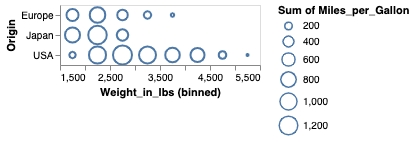

==========> 103.json


==========> 20.json


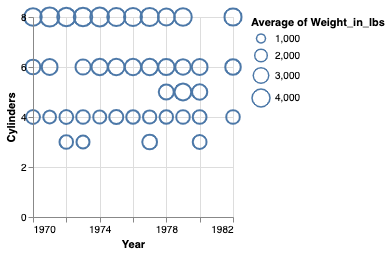

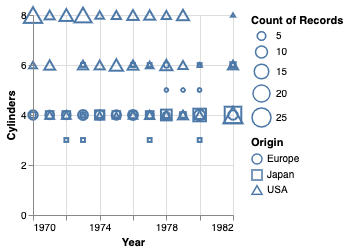

==========> 98.json


==========> 77.json


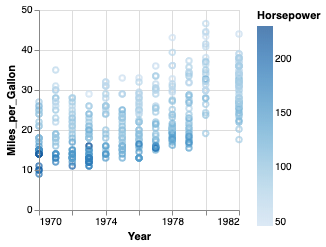

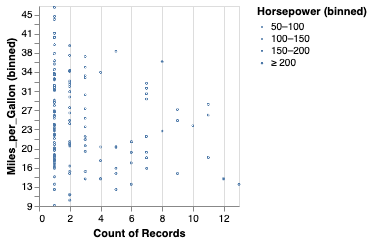

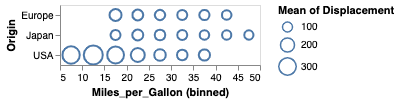

==========> 139.json


==========> 61.json


==========> 36.json


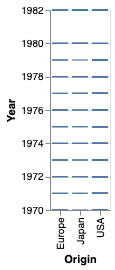

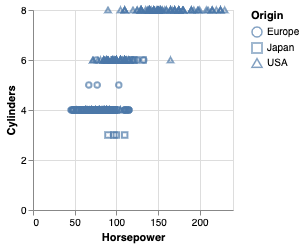

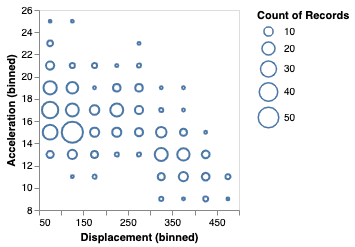

==========> 119.json


==========> 41.json


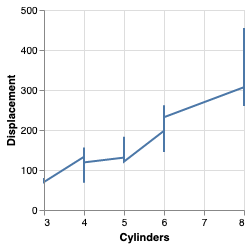

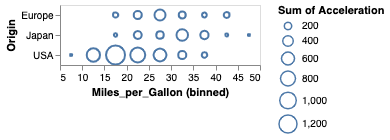

==========> 16.json


==========> 57.json


==========> 94.json


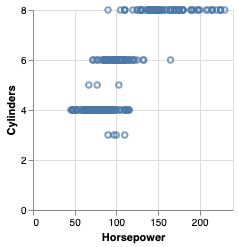

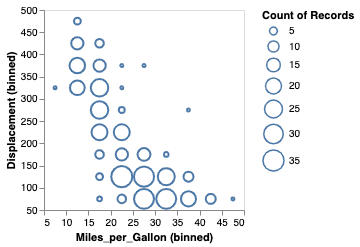

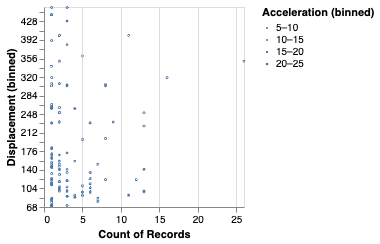

==========> 123.json


==========> 82.json


==========> 6.json


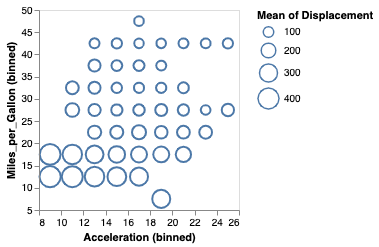

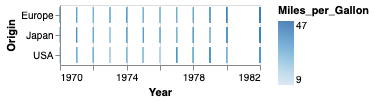

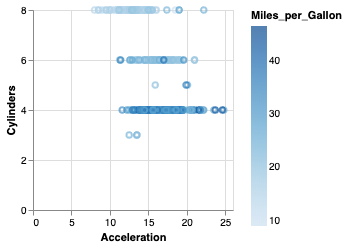

==========> 135.json
[post_process] >> update aggregate


==========> 7.json


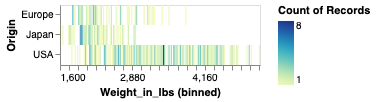

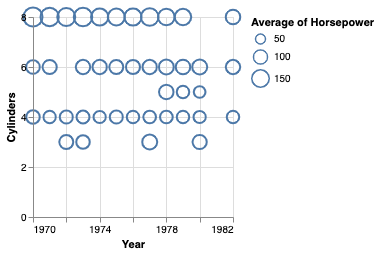

==========> 83.json
[post_process] >> update aggregate


==========> 134.json


==========> 95.json


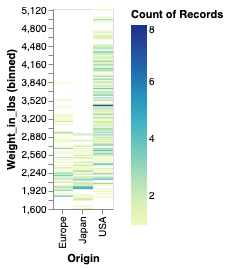

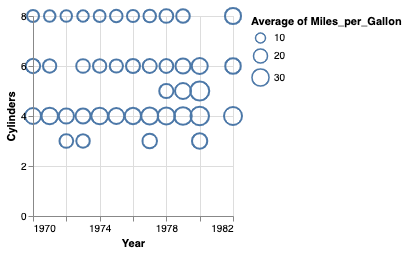

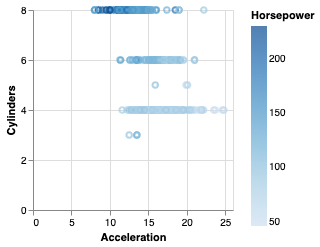

==========> 122.json


==========> 56.json


==========> 17.json


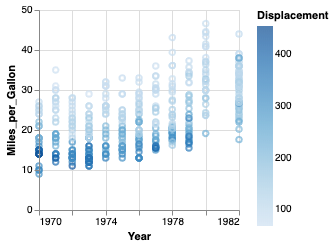

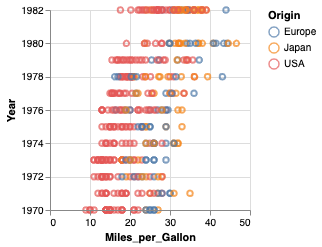

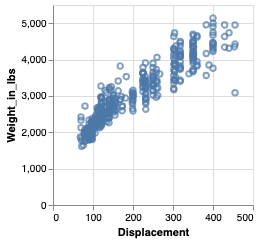

==========> 118.json


==========> 40.json


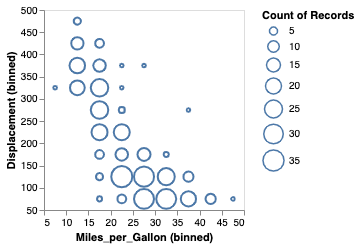

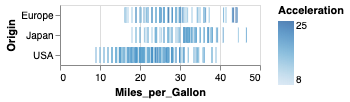

==========> 37.json


==========> 138.json


==========> 60.json


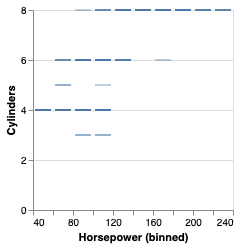

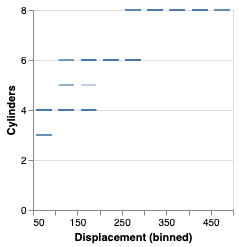

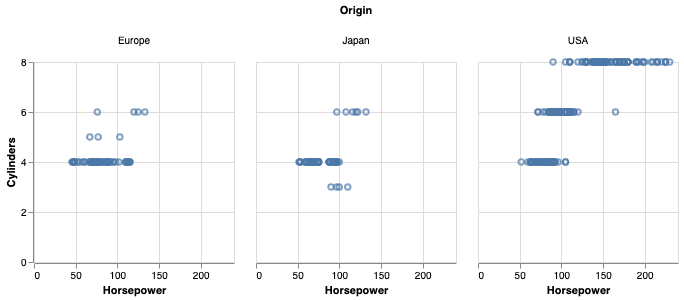

==========> 99.json


==========> 76.json


==========> 21.json


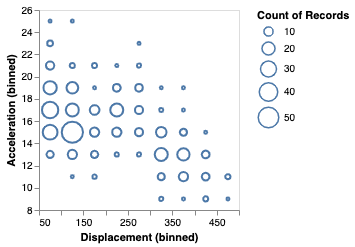

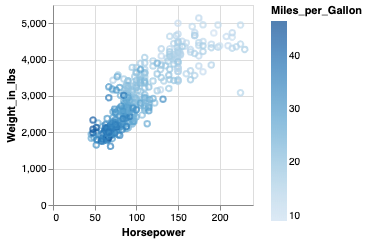

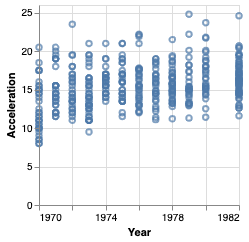

==========> 102.json


==========> 155.json


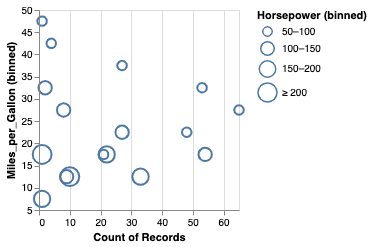

==========> 143.json
[post_process] >> update aggregate


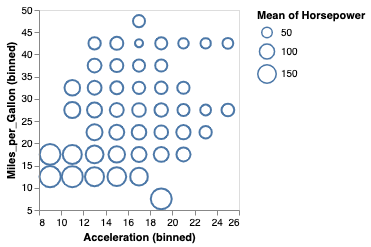

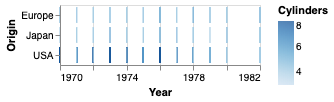

==========> 114.json


==========> 47.json


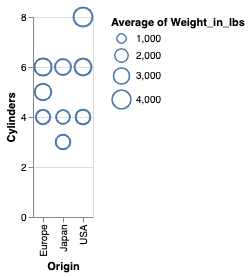

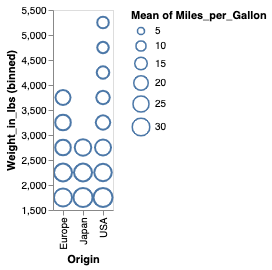

==========> 148.json
[post_process] >> update aggregate


==========> 10.json


==========> 109.json


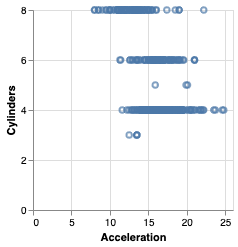

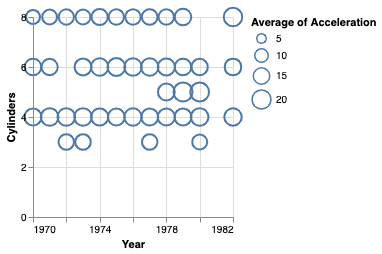

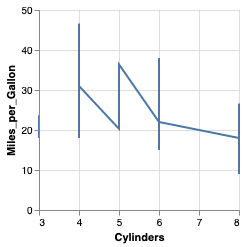

==========> 51.json
[post_process] >> update aggregate


==========> 92.json


==========> 125.json


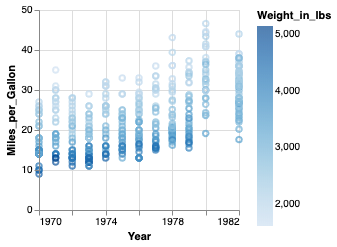

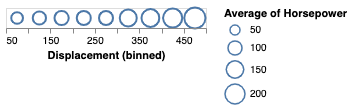

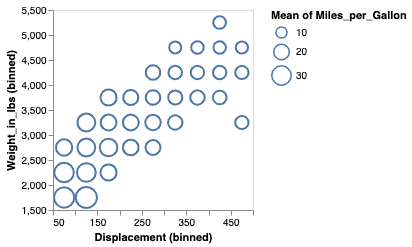

==========> 84.json
[post_process] >> update aggregate


==========> 0.json


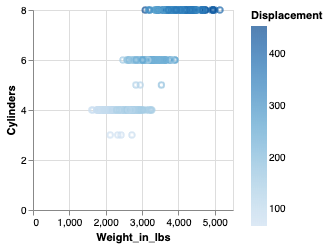

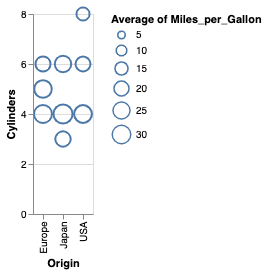

==========> 133.json


==========> 113.json


==========> 144.json


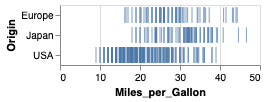

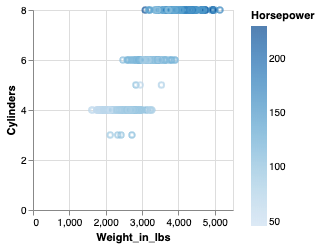

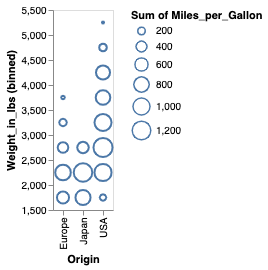

==========> 152.json


==========> 105.json


==========> 26.json


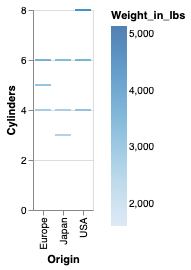

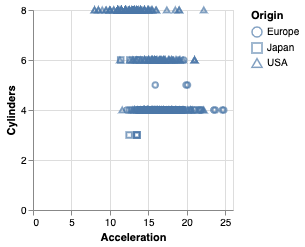

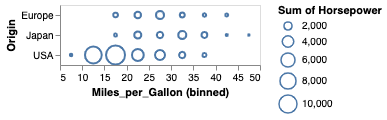

==========> 129.json


==========> 71.json


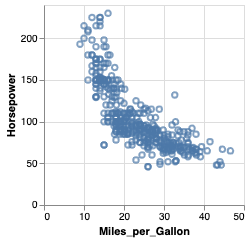

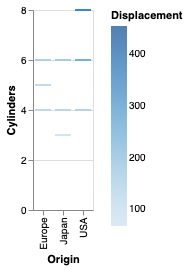

==========> 88.json


==========> 67.json


==========> 30.json
[post_process] >> update aggregate


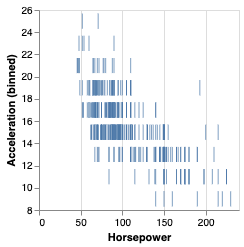

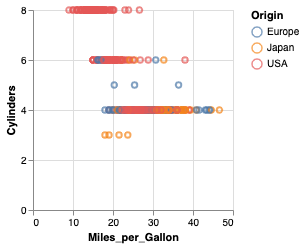

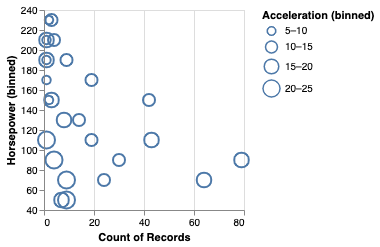

==========> 31.json


==========> 89.json


==========> 66.json


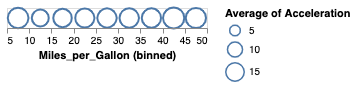

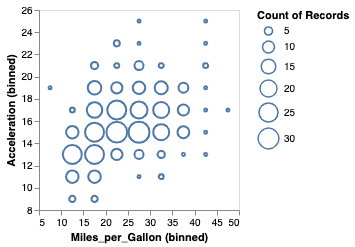

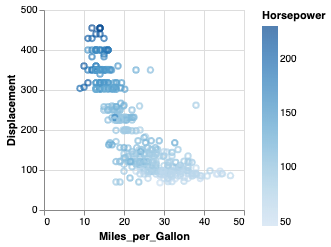

==========> 128.json
[post_process] >> update aggregate


==========> 70.json


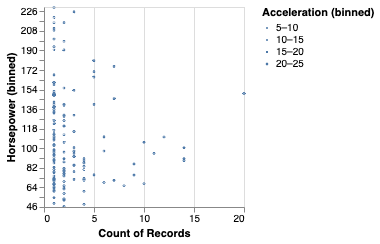

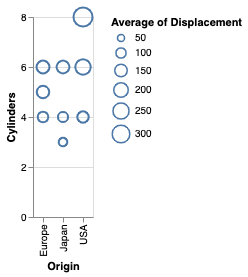

==========> 27.json


==========> 104.json


==========> 153.json


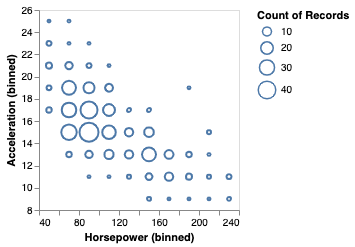

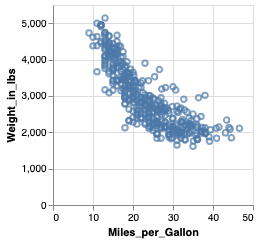

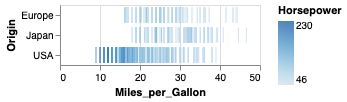

==========> 145.json


==========> 112.json


==========> 1.json


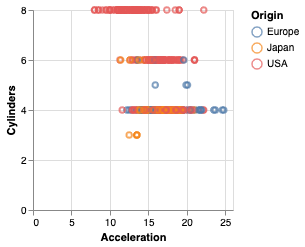

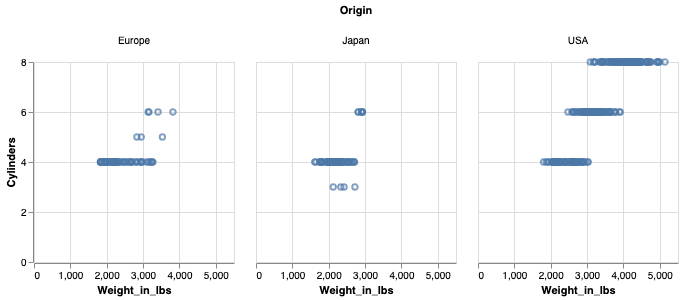

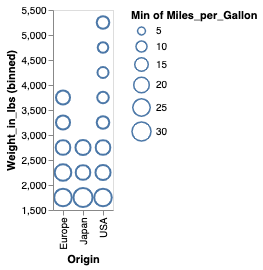

==========> 85.json


==========> 132.json


==========> 93.json


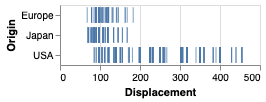

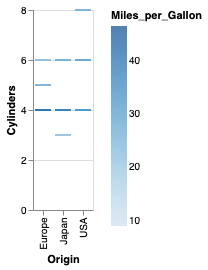

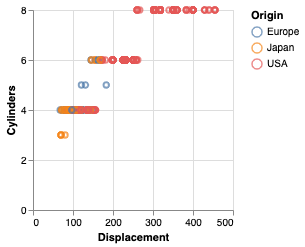

==========> 124.json


==========> 108.json


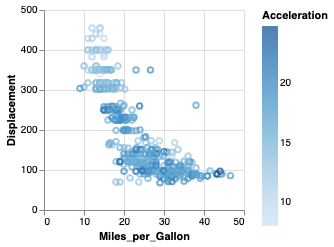

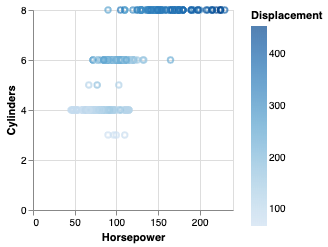

==========> 50.json


==========> 149.json
[post_process] >> update aggregate


==========> 11.json


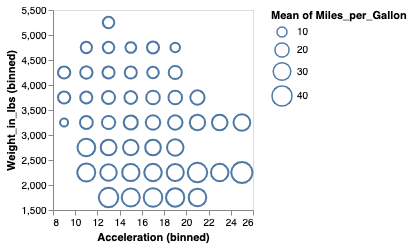

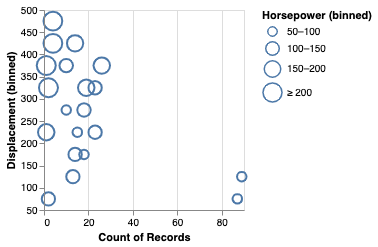

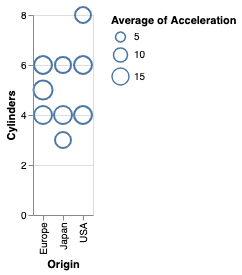

==========> 46.json


==========> 69.json


==========> 131.json


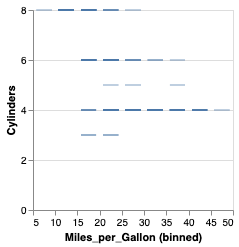

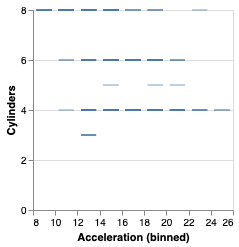

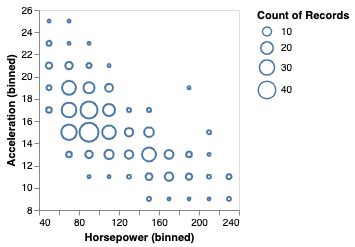

==========> 2.json


==========> 86.json


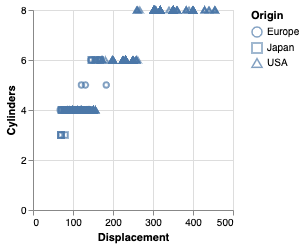

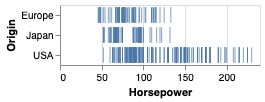

==========> 127.json
[post_process] >> update aggregate


==========> 90.json


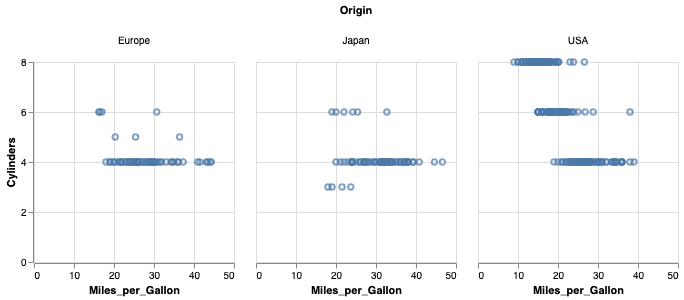

==========> 28.json


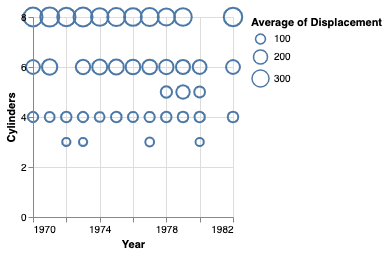

==========> 53.json


==========> 12.json


==========> 45.json


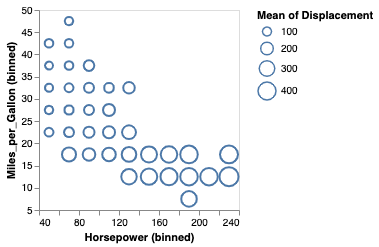

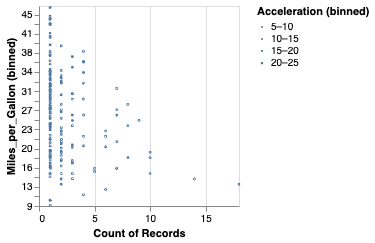

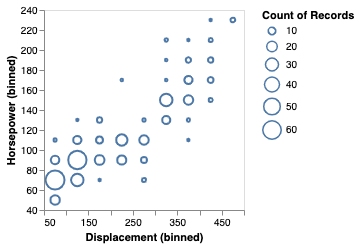

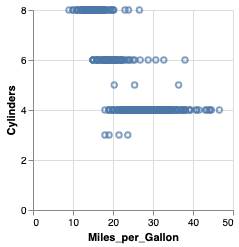

==========> 32.json


==========> 65.json


==========> 73.json


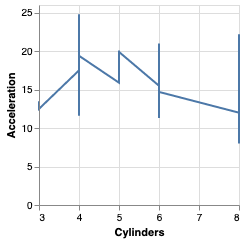

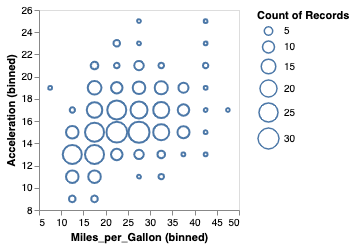

==========> 24.json


==========> 107.json


==========> 150.json


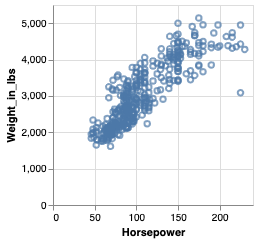

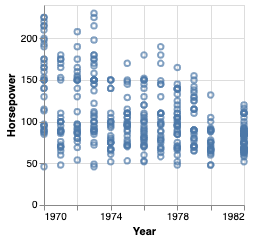

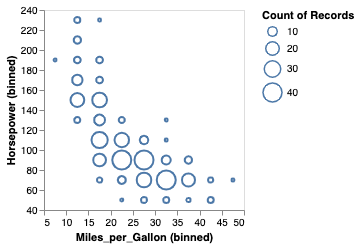

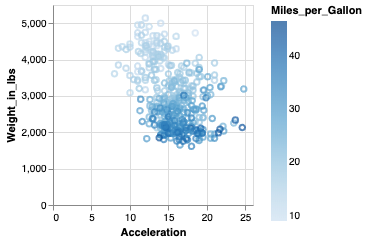

==========> 146.json


==========> 49.json


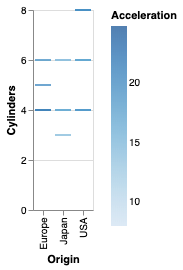

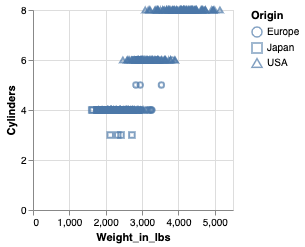

==========> 111.json


==========> 48.json
[post_process] >> add count


==========> 110.json


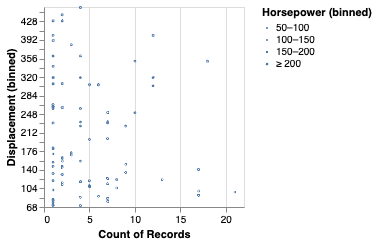

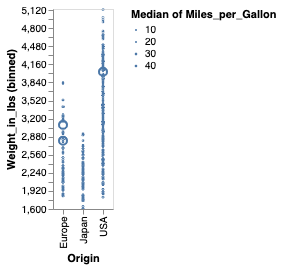

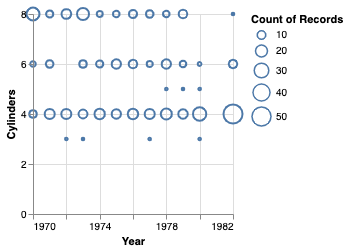

==========> 147.json


==========> 151.json


==========> 106.json


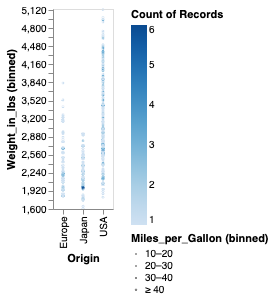

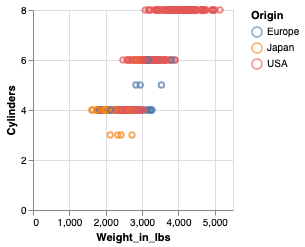

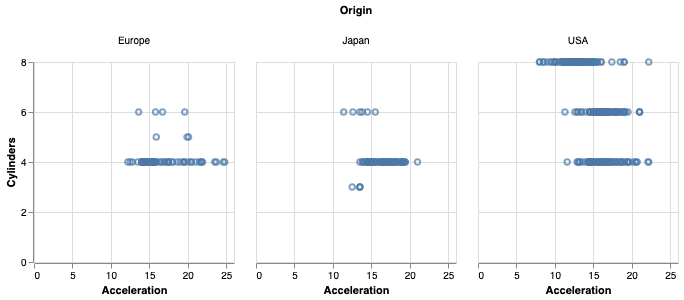

==========> 25.json


==========> 72.json


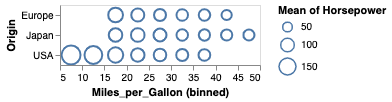

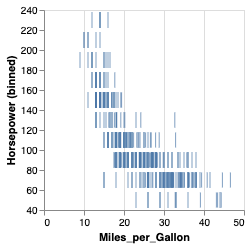

==========> 64.json


==========> 33.json


==========> 44.json


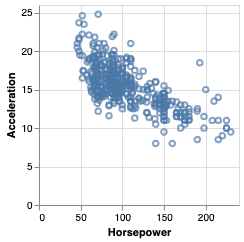

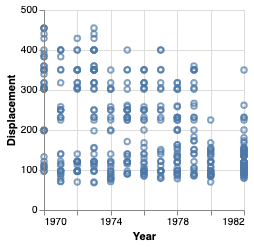

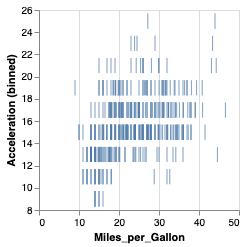

==========> 13.json


==========> 52.json


==========> 29.json


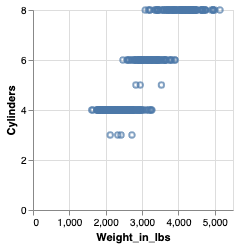

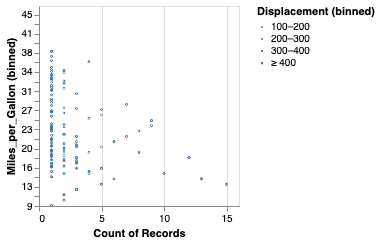

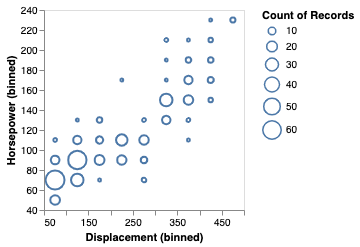

==========> 126.json


==========> 91.json


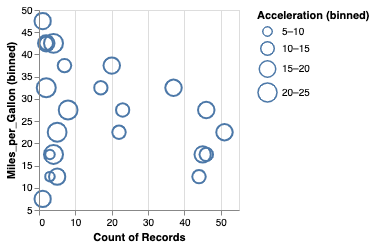

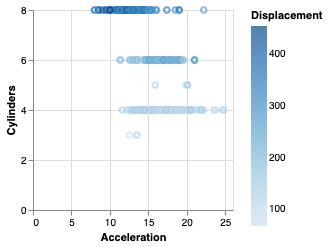

==========> 68.json
[post_process] >> update aggregate


==========> 130.json


==========> 87.json


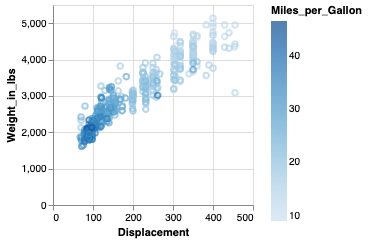

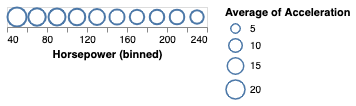

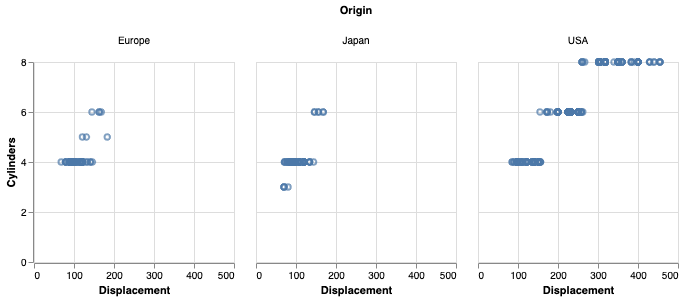

==========> 3.json


==========> 34.json


==========> 63.json


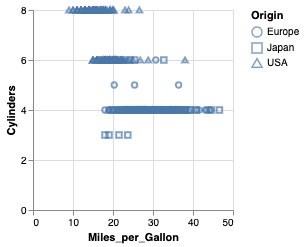

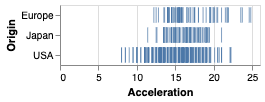

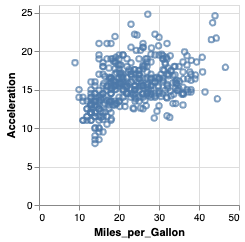

==========> 8.json


==========> 75.json


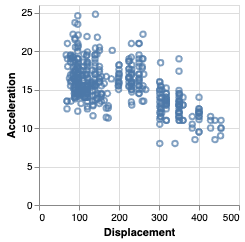

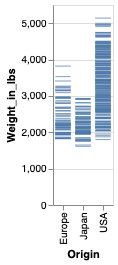

==========> 22.json
[post_process] >> update aggregate


==========> 59.json
[post_process] >> update aggregate


==========> 101.json


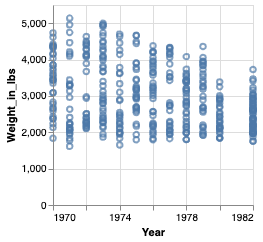

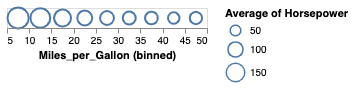

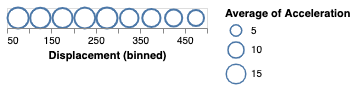

==========> 18.json


==========> 140.json


==========> 117.json


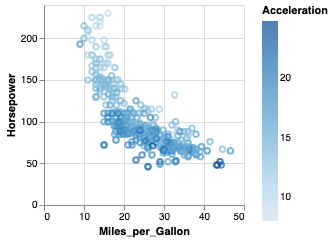

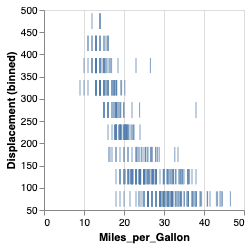

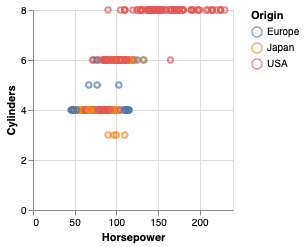

==========> 38.json


==========> 137.json


==========> 4.json
[post_process] >> update aggregate


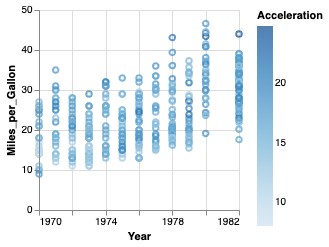

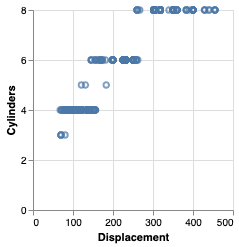

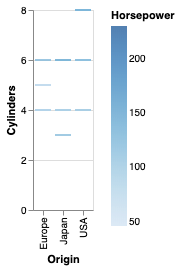

==========> 80.json


==========> 79.json


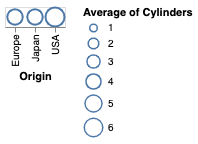

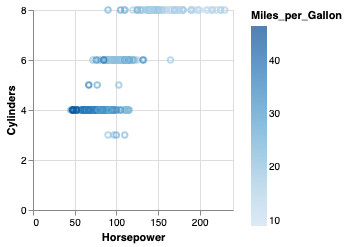

==========> 121.json


==========> 96.json


==========> 55.json


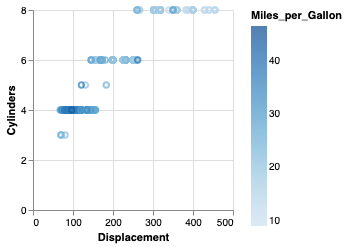

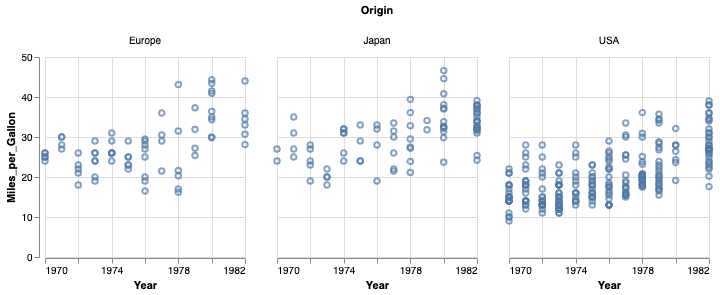

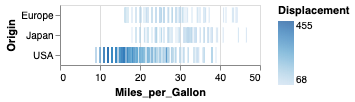

==========> 14.json


==========> 43.json


==========> 42.json


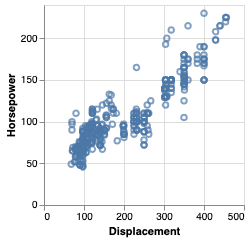

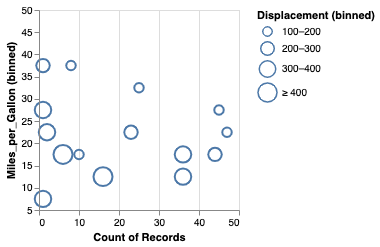

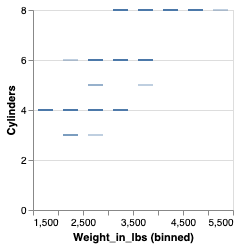

==========> 15.json
[post_process] >> update aggregate


==========> 54.json


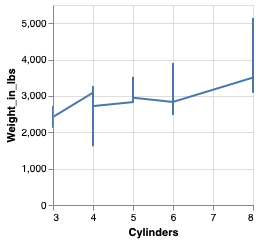

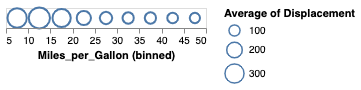

==========> 78.json


==========> 120.json


==========> 97.json


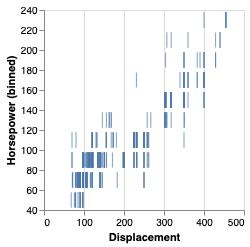

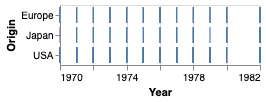

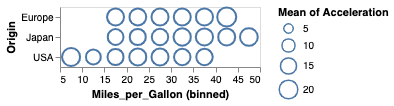

==========> 136.json
[post_process] >> update aggregate


==========> 81.json


==========> 5.json


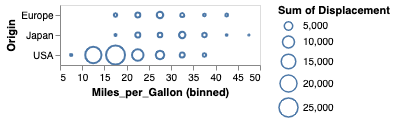

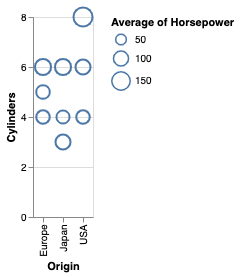

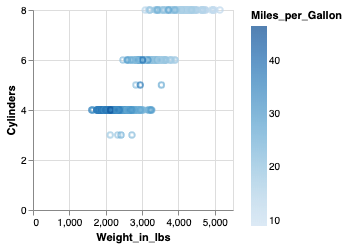

==========> 39.json


==========> 116.json


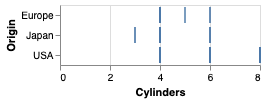

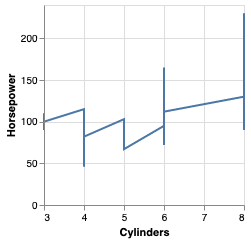

==========> 19.json


==========> 141.json


==========> 58.json


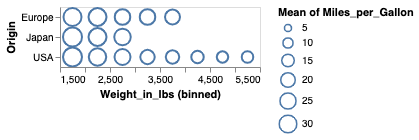

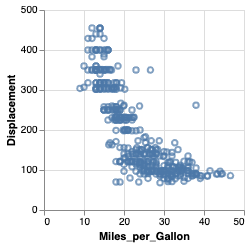

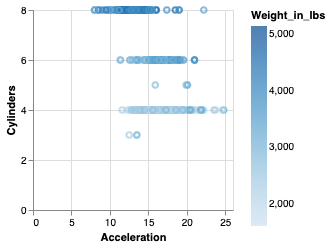

==========> 100.json


==========> 23.json


==========> 74.json


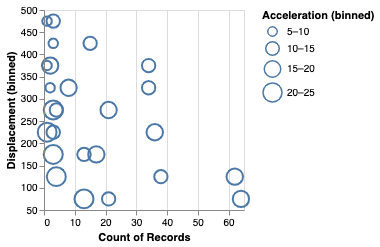

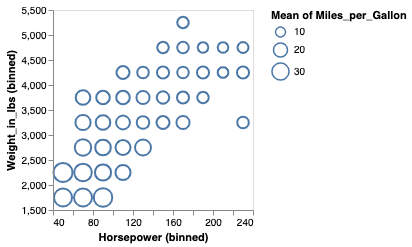

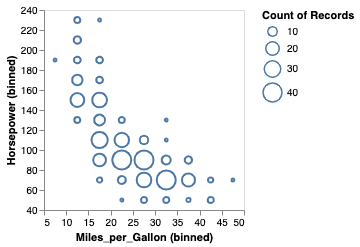

==========> 62.json


==========> 9.json


==========> 35.json


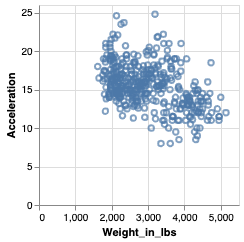

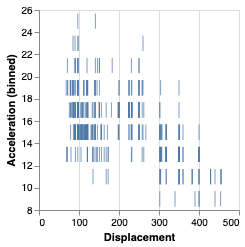

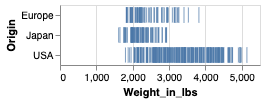

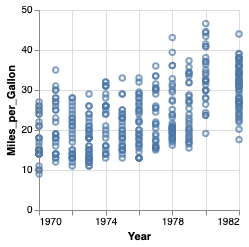

In [2]:
from vega import VegaLite
from draco.refine_strategies import post_process_vl_spec
from io import StringIO

import sys

class Capturing(list):
    def __enter__(self):
        self._stdout = sys.stdout
        self._stderr = sys.stderr
        sys.stdout = self._stringio = StringIO()
        sys.stderr = self._stringerrio = StringIO()
        return self
    def __exit__(self, *args):
        self.extend(self._stringio.getvalue().splitlines())
        del self._stringio    # free up some memory
        del self._stringerrio
        sys.stdout = self._stdout
        sys.stderr = self._stderr
        
INPUT_DIR = "../../vega-datasets"
OUTPUT_DIR = "../../vis-viewer/sample-outputs"
table_name = "cars"

#with Capturing():
enum_table_visualizations(table_name, INPUT_DIR, OUTPUT_DIR)

VIS_DIR = os.path.join(OUTPUT_DIR, table_name)

vl_files = [s for s in os.listdir(VIS_DIR) if s.endswith(".json")]
for vl_file in vl_files:
    print(f"==========> {vl_file}")
    with open(os.path.join(VIS_DIR, vl_file), "r") as f:
        spec = json.load(f)
        spec = post_process_vl_spec(spec)
        VegaLite(spec).display()